In [66]:
#!pip install pygwalker

In [2]:
import requests
import json
import pandas as pd
import pygwalker as pyg

In [3]:
def get_data(url):
    response=requests.get(url)
    data=response.text
    data=json.loads(data)
    return data

In [4]:
value_id1='0100011D00FF'
value_id2='0100021D00FF'

In [5]:
data_1 = get_data("https://exnaton-public-s3-bucket20230329123331528000000001.s3.eu-central-1.amazonaws.com/challenge/95ce3367-cbce-4a4d-bbe3-da082831d7bd.json")

In [6]:
data_1

{'data': [{'measurement': 'energy',
   'timestamp': '2023-02-28T23:45:00.000Z',
   'tags': {'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd',
    'quality': 'measured'},
   '0100011D00FF': 0.0117},
  {'measurement': 'energy',
   'timestamp': '2023-02-28T23:30:00.000Z',
   'tags': {'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd',
    'quality': 'measured'},
   '0100011D00FF': 0.0117},
  {'measurement': 'energy',
   'timestamp': '2023-02-28T23:15:00.000Z',
   'tags': {'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd',
    'quality': 'measured'},
   '0100011D00FF': 0.0118},
  {'measurement': 'energy',
   'timestamp': '2023-02-28T23:00:00.000Z',
   'tags': {'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd',
    'quality': 'measured'},
   '0100011D00FF': 0.0118},
  {'measurement': 'energy',
   'timestamp': '2023-02-28T22:45:00.000Z',
   'tags': {'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd',
    'quality': 'measured'},
   '0100011D00FF': 0.021},
  {'measurement': 'energy',
   'timestamp': '2023-02-

In [7]:
data_2 = get_data("https://exnaton-public-s3-bucket20230329123331528000000001.s3.eu-central-1.amazonaws.com/challenge/1db7649e-9342-4e04-97c7-f0ebb88ed1f8.json")

In [8]:
data_2

{'data': [{'measurement': 'energy',
   'timestamp': '2023-02-28T23:45:00.000Z',
   'tags': {'muid': '1db7649e-9342-4e04-97c7-f0ebb88ed1f8',
    'quality': 'measured'},
   '0100021D00FF': 0},
  {'measurement': 'energy',
   'timestamp': '2023-02-28T23:30:00.000Z',
   'tags': {'muid': '1db7649e-9342-4e04-97c7-f0ebb88ed1f8',
    'quality': 'measured'},
   '0100021D00FF': 0},
  {'measurement': 'energy',
   'timestamp': '2023-02-28T23:15:00.000Z',
   'tags': {'muid': '1db7649e-9342-4e04-97c7-f0ebb88ed1f8',
    'quality': 'measured'},
   '0100021D00FF': 0},
  {'measurement': 'energy',
   'timestamp': '2023-02-28T23:00:00.000Z',
   'tags': {'muid': '1db7649e-9342-4e04-97c7-f0ebb88ed1f8',
    'quality': 'measured'},
   '0100021D00FF': 0},
  {'measurement': 'energy',
   'timestamp': '2023-02-28T22:45:00.000Z',
   'tags': {'muid': '1db7649e-9342-4e04-97c7-f0ebb88ed1f8',
    'quality': 'measured'},
   '0100021D00FF': 0},
  {'measurement': 'energy',
   'timestamp': '2023-02-28T22:30:00.000Z',
   't

In [9]:
data_1.keys(), data_2.keys()

(dict_keys(['data']), dict_keys(['data']))

In [10]:
def prepare_df(data, value_id):
    df = pd.DataFrame(data['data'])
    
    # Convert the timestamp to datetime format
    df['timestamp'] = pd.to_datetime(df['timestamp'])

    # Create separate 'date' and 'time' columns
    df['date'] = df['timestamp'].dt.date
    df['time'] = df['timestamp'].dt.time
    
    #rename column value_id to energy_consumed
    df=df.rename({value_id: "units_consumed"}, axis = 1)
    
    #df.set_index('timestamp', inplace=True)
    df['units_consumed x 1000'] = df["units_consumed"].apply(lambda x: x*1000)
    
    
    df = df[['timestamp','date', 'time', 'measurement', 'units_consumed', 'units_consumed x 1000', 'tags']]
    
    df = pd.concat([df.drop(['tags'], axis=1), df['tags'].apply(pd.Series)], axis=1)
    
    df = df[::-1]
    
    return df

In [11]:
df_1 = prepare_df(data_1,value_id1)
df_1.head()

,timestamp,date,time,measurement,units_consumed,units_consumed x 1000,muid,quality
2687,2023-02-01 00:00:00+00:00,2023-02-01,00:00:00,energy,0.0162,16.2,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2686,2023-02-01 00:15:00+00:00,2023-02-01,00:15:00,energy,0.0117,11.7,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2685,2023-02-01 00:30:00+00:00,2023-02-01,00:30:00,energy,0.0118,11.8,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2684,2023-02-01 00:45:00+00:00,2023-02-01,00:45:00,energy,0.0117,11.7,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2683,2023-02-01 01:00:00+00:00,2023-02-01,01:00:00,energy,0.0117,11.7,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured


In [15]:
df_2 = prepare_df(data_2,value_id2)
df_2.head()

,timestamp,date,time,measurement,units_consumed,units_consumed x 1000,muid,quality
2687,2023-02-01 00:00:00+00:00,2023-02-01,00:00:00,energy,0.0,0.0,1db7649e-9342-4e04-97c7-f0ebb88ed1f8,measured
2686,2023-02-01 00:15:00+00:00,2023-02-01,00:15:00,energy,0.0,0.0,1db7649e-9342-4e04-97c7-f0ebb88ed1f8,measured
2685,2023-02-01 00:30:00+00:00,2023-02-01,00:30:00,energy,0.0,0.0,1db7649e-9342-4e04-97c7-f0ebb88ed1f8,measured
2684,2023-02-01 00:45:00+00:00,2023-02-01,00:45:00,energy,0.0,0.0,1db7649e-9342-4e04-97c7-f0ebb88ed1f8,measured
2683,2023-02-01 01:00:00+00:00,2023-02-01,01:00:00,energy,0.0,0.0,1db7649e-9342-4e04-97c7-f0ebb88ed1f8,measured


In [12]:
# Calculate weekday and ISO weekday
df_1['weekday'] = df_1['timestamp'].dt.weekday
#df_1['iso_weekday'] = df_1['timestamp'].dt.isoweekday()

print(df_1[df_1['weekday']==1]['units_consumed'].values.sum())

13.081299999999999


In [16]:
walker_1 = pyg.walk(df_2,spec='pygwalker_spec_data_1.json')

Box(children=(HTML(value='\n<div id="ifr-pyg-00061fa8d66f9276l8WsVRQ1nAC32DBf" style="height: auto">\n    <hea…

In [134]:
from pandas.plotting import autocorrelation_plot
import matplotlib.pyplot as plt

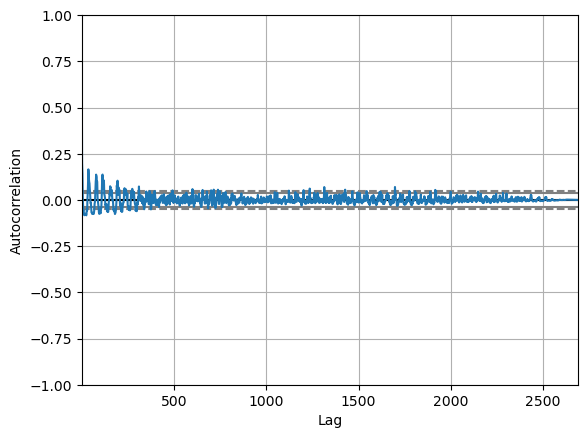

In [135]:
# Plot autocorrelation
autocorrelation_plot(df_1['units_consumed'])
plt.show()

In [107]:
df_2, walker_2 = get_walker(data_2,value_id2)

Box(children=(HTML(value='\n<div id="ifr-pyg-00061fa188d126a9edkSw4qn6HjL50KT" style="height: auto">\n    <hea…

In [77]:
df_1

,measurement,timestamp,tags,0100011D00FF
0,energy,2023-02-28T23:45:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0117
1,energy,2023-02-28T23:30:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0117
2,energy,2023-02-28T23:15:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0118
3,energy,2023-02-28T23:00:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0118
4,energy,2023-02-28T22:45:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0210
...,...,...,...,...
2683,energy,2023-02-01T01:00:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0117
2684,energy,2023-02-01T00:45:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0117
2685,energy,2023-02-01T00:30:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0118
2686,energy,2023-02-01T00:15:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0117


In [78]:
df_1=process_df(df_1, '0100011D00FF')
df_1.head()

,date,time,measurement,0100011D00FF,muid,quality
timestamp,,,,,,
2023-02-28 23:45:00+00:00,2023-02-28,23:45:00,energy,0.0117,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2023-02-28 23:30:00+00:00,2023-02-28,23:30:00,energy,0.0117,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2023-02-28 23:15:00+00:00,2023-02-28,23:15:00,energy,0.0118,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2023-02-28 23:00:00+00:00,2023-02-28,23:00:00,energy,0.0118,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2023-02-28 22:45:00+00:00,2023-02-28,22:45:00,energy,0.0210,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured


In [81]:
df_2=process_df(df_2, '0100021D00FF')
df_2.head()

,date,time,measurement,0100021D00FF,muid,quality
timestamp,,,,,,
2023-02-28 23:45:00+00:00,2023-02-28,23:45:00,energy,0.0,1db7649e-9342-4e04-97c7-f0ebb88ed1f8,measured
2023-02-28 23:30:00+00:00,2023-02-28,23:30:00,energy,0.0,1db7649e-9342-4e04-97c7-f0ebb88ed1f8,measured
2023-02-28 23:15:00+00:00,2023-02-28,23:15:00,energy,0.0,1db7649e-9342-4e04-97c7-f0ebb88ed1f8,measured
2023-02-28 23:00:00+00:00,2023-02-28,23:00:00,energy,0.0,1db7649e-9342-4e04-97c7-f0ebb88ed1f8,measured
2023-02-28 22:45:00+00:00,2023-02-28,22:45:00,energy,0.0,1db7649e-9342-4e04-97c7-f0ebb88ed1f8,measured


In [82]:
#tmp=df_1.drop('tags',axis=1)

#tmp.set_index('date', inplace=True)

In [83]:
tmp

,date,time,measurement,0100011D00FF,muid,quality
timestamp,,,,,,
2023-02-01 00:00:00+00:00,2023-02-01,00:00:00,energy,0.0162,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2023-02-01 00:15:00+00:00,2023-02-01,00:15:00,energy,0.0117,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2023-02-01 00:30:00+00:00,2023-02-01,00:30:00,energy,0.0118,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2023-02-01 00:45:00+00:00,2023-02-01,00:45:00,energy,0.0117,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2023-02-01 01:00:00+00:00,2023-02-01,01:00:00,energy,0.0117,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
...,...,...,...,...,...,...
2023-02-28 22:45:00+00:00,2023-02-28,22:45:00,energy,0.0210,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2023-02-28 23:00:00+00:00,2023-02-28,23:00:00,energy,0.0118,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured
2023-02-28 23:15:00+00:00,2023-02-28,23:15:00,energy,0.0118,95ce3367-cbce-4a4d-bbe3-da082831d7bd,measured


## Data sampling frequency

## Grouping data by different time intervals

### Monthly summary
### Make sum over entire month, get the total energy consumption

### Weekly summary

In [84]:
tmp.columns

Index(['date', 'time', 'measurement', '0100011D00FF', 'muid', 'quality'], dtype='object')

In [85]:
weekly_summary = tmp.groupby(['measurement','muid','quality']).resample('W').sum(numeric_only=True)#.drop('measurement',axis=1)#.reset_index()
weekly_summary

0100011D00FF
measurement muid                                 quality  timestamp                              
energy      95ce3367-cbce-4a4d-bbe3-da082831d7bd measured 2023-02-05 00:00:00+00:00       18.1130
                                                          2023-02-12 00:00:00+00:00       25.4365
                                                          2023-02-19 00:00:00+00:00       21.6811
                                                          2023-02-26 00:00:00+00:00       25.1537
                                                          2023-03-05 00:00:00+00:00        7.2239

### Daily summary

### Hourly summary

### Are there any spikes on weekends?

C:\Users\rashm\AppData\Local\Temp\ipykernel_17720\1052048984.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  weekly_summary = tmp.groupby('measurement').resample('W').sum().drop('measurement',axis=1)#.reset_index()


KeyError: "['measurement'] not found in axis"

In [24]:
df.tail()

,measurement,timestamp,tags,0100011D00FF
2683,energy,2023-02-01T01:00:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0117
2684,energy,2023-02-01T00:45:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0117
2685,energy,2023-02-01T00:30:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0118
2686,energy,2023-02-01T00:15:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0117
2687,energy,2023-02-01T00:00:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0162


In [25]:
df.shape

(2688, 4)

In [14]:
df=df[::-1]

In [15]:
df['date'] = pd.to_datetime(df['timestamp'])

In [16]:
df.head()

,measurement,timestamp,tags,0100011D00FF,date
2687,energy,2023-02-01T00:00:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0162,2023-02-01 00:00:00+00:00
2686,energy,2023-02-01T00:15:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0117,2023-02-01 00:15:00+00:00
2685,energy,2023-02-01T00:30:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0118,2023-02-01 00:30:00+00:00
2684,energy,2023-02-01T00:45:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0117,2023-02-01 00:45:00+00:00
2683,energy,2023-02-01T01:00:00.000Z,{'muid': '95ce3367-cbce-4a4d-bbe3-da082831d7bd...,0.0117,2023-02-01 01:00:00+00:00


In [14]:
df['measurement'].unique()

array(['energy'], dtype=object)

In [19]:
df=df.drop('tags',axis=1)

In [35]:
df=df.drop('timestamp',axis=1)

In [28]:
df.set_index('date', inplace=True)

In [39]:
df.head()

,measurement,0100011D00FF
date,,
2023-02-01 00:00:00+00:00,energy,0.0162
2023-02-01 00:15:00+00:00,energy,0.0117
2023-02-01 00:30:00+00:00,energy,0.0118
2023-02-01 00:45:00+00:00,energy,0.0117
2023-02-01 01:00:00+00:00,energy,0.0117


In [43]:
#weekly_summary = df.resample('W').sum()
weekly_summary = df.groupby('measurement').resample('W').sum().drop('measurement',axis=1)#.reset_index()

In [44]:
weekly_summary

0100011D00FF
measurement date                                   
energy      2023-02-05 00:00:00+00:00       18.1130
            2023-02-12 00:00:00+00:00       25.4365
            2023-02-19 00:00:00+00:00       21.6811
            2023-02-26 00:00:00+00:00       25.1537
            2023-03-05 00:00:00+00:00        7.2239

In [45]:
hourly_summary = df.groupby('measurement').resample('H').sum().drop('measurement',axis=1)#.reset_index()

In [46]:
hourly_summary

0100011D00FF
measurement date                                   
energy      2023-02-01 00:00:00+00:00        0.0514
            2023-02-01 01:00:00+00:00        0.0470
            2023-02-01 02:00:00+00:00        0.0930
            2023-02-01 03:00:00+00:00        0.0802
            2023-02-01 04:00:00+00:00        0.0469
...                                             ...
            2023-02-28 19:00:00+00:00        0.0469
            2023-02-28 20:00:00+00:00        0.0472
            2023-02-28 21:00:00+00:00        0.0594
            2023-02-28 22:00:00+00:00        0.1096
            2023-02-28 23:00:00+00:00        0.0470

[672 rows x 1 columns]

In [47]:
daily_summary = df.groupby('measurement').resample('D').sum().drop('measurement',axis=1)#.reset_index()

In [50]:
daily_summary

0100011D00FF
measurement date                                   
energy      2023-02-01 00:00:00+00:00        1.8766
            2023-02-02 00:00:00+00:00        4.4577
            2023-02-03 00:00:00+00:00        3.3680
            2023-02-04 00:00:00+00:00        4.6213
            2023-02-05 00:00:00+00:00        3.7894
            2023-02-06 00:00:00+00:00        4.1265
            2023-02-07 00:00:00+00:00        3.4733
            2023-02-08 00:00:00+00:00        5.2117
            2023-02-09 00:00:00+00:00        2.6873
            2023-02-10 00:00:00+00:00        3.1729
            2023-02-11 00:00:00+00:00        3.0214
            2023-02-12 00:00:00+00:00        3.7434
            2023-02-13 00:00:00+00:00        4.5861
            2023-02-14 00:00:00+00:00        2.1701
            2023-02-15 00:00:00+00:00        2.3131
            2023-02-16 00:00:00+00:00        2.8585
            2023-02-17 00:00:00+00:00        2.2967
            2023-02-18 00:00:00+00:00        3.3606
            2023-02-19 00:00:00+00:00        4.0960
            2023-02-20 00:00:00+00:00        4.3543
            2023-02-21 00:00:00+00:00        4.3952
            2023-02-22 00:00:00+00:00        2.5505
            2023-02-23 00:00:00+00:00        2.7866
            2023-02-24 00:00:00+00:00        3.6970
            2023-02-25 00:00:00+00:00        4.0103
            2023-02-26 00:00:00+00:00        3.3598
            2023-02-27 00:00:00+00:00        4.1812
            2023-02-28 00:00:00+00:00        3.0427